In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
from dataclasses import dataclass, field
import json
import numpy as np
from matplotlib import pyplot as plt
import matplotlib.image as mpimg
import matplotlib.patches as patches
from mpl_toolkits.mplot3d import Axes3D

from typing import List
# from base import Scene
from PIL import Image
import torch.nn.functional as F

np.set_printoptions(suppress=True)
# %matplotlib ipympl

In [3]:
import torch
from mmdet.apis import init_detector, inference_detector, show_result_pyplot
from torchvision.models import resnet18, ResNet18_Weights

config_file = '../../Projects/mmdetection/configs/swin/mask_rcnn_swin-t-p4-w7_fpn_fp16_ms-crop-3x_coco.py'
checkpoint_file = '../../Projects/mmdetection/checkpoints/mask_rcnn_swin-t-p4-w7_fpn_fp16_ms-crop-3x_coco_20210908_165006-90a4008c.pth'

# build the model from a config file and a checkpoint file
model = init_detector(config_file, checkpoint_file, device='cuda:0')


c:\Users\Leonard\miniconda3\envs\openmmlab\lib\site-packages\mmcv\__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(


load checkpoint from local path: ../../Projects/mmdetection/checkpoints/mask_rcnn_swin-t-p4-w7_fpn_fp16_ms-crop-3x_coco_20210908_165006-90a4008c.pth


In [4]:
@dataclass
class Line:
    origin: np.ndarray
    direction: np.ndarray

    @classmethod
    def from_camera_coor(cls, origin, coor):
        return cls(np.array(origin), np.array(coor))
    
    def point(self, r):
        return self.origin + r*self.direction
    

@dataclass
class Camera:
    filename: str=''
    position: np.ndarray=np.array([0., 0., 0.])
    quaternion: np.ndarray=np.array([1., 0., 0., 0.])  # angle in quaternion

    resolution: np.ndarray=np.array([3840, 2160])
    sensor_size: np.ndarray=np.array([30, 30])
    matrix: np.ndarray=np.array([0, 0, 0, 0, 0, 0, 0, 0, 0])
    # intrinsic: np.ndarray=np.array([[0, 0, 0], [0, 0, 0], [0, 0, 0]])
    
    @staticmethod
    def qm_2(quaternion, vector):
        q0, q1, q2, q3 = quaternion
        matrix = np.array([
            [1-2*q2**2-2*q3**2, 2*(q1*q2+q0*q3), 2*(q1*q3-q0*q2)],
            [2*(q1*q2-q0*q3), 1-2*q1**2-2*q3**2, 2*(q2*q3+q0*q1)],
            [2*(q1*q3+q0*q2), 2*(q2*q3-q0*q1), 1-2*q1**2-2*q2**2]
        ])

        return np.matmul(vector, matrix.T)

    @staticmethod
    def _convert_to_ndarray(obj):
        if not isinstance(obj, (np.ndarray, np.generic)):
            return np.array(obj)
        return obj

    def __post_init__(self):
        self.position = self._convert_to_ndarray(self.position)
        self.quaternion = self._convert_to_ndarray(self.quaternion)
        self.resolution = self._convert_to_ndarray(self.resolution)
        self.sensor_size = self._convert_to_ndarray(self.sensor_size)  # measured in millimeters
        self.matrix = self._convert_to_ndarray(self.matrix).reshape((3, 3))

        focal = 20.78461  # measured in millimeters
        self.intrinsic = np.array([
            [focal*self.resolution[0]/self.sensor_size[0], 0, 0],
            [0, -focal*self.resolution[0]/self.sensor_size[1], 0],
            [self.resolution[0]/2, self.resolution[1]/2, 1],
        ])
    
    def world_to_camera(self, world_coor: List[np.ndarray]):
        world_coor = [coor - self.position for coor in world_coor]  # translation
        # rotation
        camera_coor = [
            self.qm_2(self.quaternion, coor)
            for coor in world_coor
        ]
        return camera_coor

    def camera_to_pixel(self, camera_coor: List[np.ndarray]) -> List[np.ndarray]:
        ndc_coor = [np.matmul(coor, self.intrinsic) for coor in camera_coor]
        pixel_coor = [np.floor((coor/coor[-1])[:-1]) for coor in ndc_coor]

        return pixel_coor

    def pixel_to_ray(self, pixel_coor):

        inv_intrinsic = np.linalg.inv(self.intrinsic)
        ndc_coor = [
            np.matmul(np.array([*coor, 1]), inv_intrinsic)
            for coor in pixel_coor
        ]

        q_ = self.quaternion
        camera_coor = [
            self.qm_2(np.array([q_[0], -q_[1], -q_[2], -q_[3]]), coor)
            for coor in ndc_coor
        ]

        return [Line.from_camera_coor(self.position, coor) for coor in camera_coor]
    
    @classmethod
    def from_capture(cls, f_dir, capture):
        q_ = capture['rotation']
        return cls(
            filename=os.path.join(f_dir, capture['filename']),
            position=capture['position'],
            quaternion=np.array([q_[3], q_[0], q_[1], q_[2]]),
            resolution=capture['dimension'],
            matrix=capture['matrix'],
        )


@dataclass
class BoundingBox:
    instanceId: str
    center: np.ndarray
    size: np.ndarray
    
    @classmethod
    def from_anno(cls, info):
        size = np.array([dim/2 for dim in info['dimension']])
        return cls(
            instanceId=info['instanceId'],
            center=np.array(info['origin']) + size,
            size=size
        )


@dataclass
class Location:
    origin: np.ndarray

    @classmethod
    def from_info(cls, info, rotation, offset):
        ret = Camera.qm_2(
            rotation*np.array([1, -1, -1, -1]),
            np.array(info['translation'])
        )
        return cls(ret + offset)
    

@dataclass
class DeepCamera(Camera):
    object_detector: torch.nn.Module=None

    gt_bboxes: List[BoundingBox]=field(default_factory=list)
    location: Location=None

    pred_bboxes: List[BoundingBox]=field(init=False)

    def __post_init__(self):
        super().__post_init__()
        result = inference_detector(self.object_detector, self.filename)
        for i in range(len(result[1])):
            if len(result[1][i]) > 0:
                for j in range(len(result[1][i])):
                    result[1][i][j] = np.zeros_like(result[1][i][j], dtype=bool)
        
        for i in range(len(result[1])):
            if len(result[1][i]) > 0:
                for j in range(len(result[1][i])):
                    result[1][i][j] = np.zeros_like(result[1][i][j], dtype=bool)
        
        image = Image.open(self.filename).convert('RGB')
        human_pred = result[0][0]

        show_result_pyplot(self.object_detector, self.filename, result)
        
        self.preds = []
        # for pred in human_pred:
        for pred in human_pred:
            if pred[-1] < 0.9:
                continue
            bbox = BoundingBox(
                instanceId=-1,
                center=np.array([(pred[0] + pred[2])/2, (pred[1] + pred[3])/2]),
                size=np.array([(pred[2]-pred[0])/2, (pred[3]-pred[1])/2])
            )
            tl, br = bbox.center - bbox.size, bbox.center + bbox.size
            image_ = image.crop((*tl, *br))

            t, l = tl
            b, r = br
            max_iou = 0
            for gt_box in self.gt_bboxes:
                tl_, br_ = gt_box.center - gt_box.size, gt_box.center + gt_box.size
                t_, l_ = tl_
                b_, r_ = br_

                o = np.array([max(t, t_), max(l, l_)])
                u = np.array([min(b, b_), min(r, r_)])

                w = u[0] - o[0]
                h = u[1] - o[1]
                intersection = w * h
                union = ((b-t)*(r-l)) + ((b_-t_)*(r_-l_)) - intersection
                iou = intersection / (union + 1e-8)
                max_iou = max(max_iou, iou)

            self.preds.append((
                bbox,
                pred[-1],
                max_iou,
                self.pixel_to_ray([np.array([(pred[0] + pred[2])/2, (pred[1] + pred[3])/2])])[0]
            ))
            # print('a'*30)
        
        self.gt_lines = [(box.instanceId, self.pixel_to_ray([box.center])[0]) for box in self.gt_bboxes]
        self.pred_lines = [(None, self.pixel_to_ray([pred[0].center])[0]) for pred in self.preds]
            
    @classmethod
    def from_capture(cls, f_dir, capture, object_detector):
        camera = Camera.from_capture(f_dir, capture)
        annotations = [anno['values'] for anno in capture['annotations'] if '2D' in anno['id']][0]
        return cls(
            filename=camera.filename,
            position=camera.position,
            quaternion=camera.quaternion,
            resolution=camera.resolution,
            sensor_size=camera.sensor_size,
            matrix=camera.matrix,
            object_detector=object_detector,
            # resnet=resnet, preprocess=preprocess,
            gt_bboxes=[BoundingBox.from_anno(anno) for anno in annotations]
        )
    

class Scene:
    offset = np.array([0.00956252, 0, -0.068264])

    def __init__(self, f_dir, cameras: List[DeepCamera], locations: List[Location]):
        self.f_dir = f_dir
        self.cameras = cameras
        self.locations = locations
        # self.object_pairs = self._object_pairing()

        self.gt_locations = self._get_gt_locations()
        self.pred_locations = self._get_pred_locations()

    @staticmethod
    def _find_points(line_a: Line, line_b: Line):
        d = line_b.origin - line_a.origin
        u = np.dot(line_a.direction, line_b.direction)
        e = np.dot(line_a.direction, d)
        f = np.dot(line_b.direction, d)

        r_1 = (e - u*f) / (1 - u**2)
        r_2 = (f - u*e) / (u**2 - 1)

        p1 = line_a.point(r_1)
        p2 = line_b.point(r_2)

        return (p1 + p2) / 2
    
    def _get_gt_locations(self):
        camera_0 = self.cameras[0]
        camera_1 = self.cameras[1]

        locations = []
        for line_a in camera_0.gt_lines:
            for line_b in camera_1.gt_lines:
                if line_a[0] == line_b[0]:  # same instance_id
                    locations.append((line_a[0], self._find_points(line_a[1], line_b[1])))
                    break
        return locations
    
    def _get_pred_locations(self):
        camera_0 = self.cameras[0]
        camera_1 = self.cameras[1]

        locations = []
        for line_a in camera_0.pred_lines:
            for line_b in camera_1.pred_lines:
                locations.append((None, self._find_points(line_a[1], line_b[1])))
                break
        return locations

    @classmethod
    def from_captures(cls, f_dir, captures, object_detector):
        cameras = [DeepCamera.from_capture(f_dir, capture, object_detector) for capture in captures]
        
        anno_3d = [anno['values'] for anno in captures[0]['annotations'] if '3D' in anno['id']][0]
        anno_3d = [
            (anno['instanceId'], Location.from_info(anno, cameras[0].quaternion, cameras[0].position))
            for anno in anno_3d if 'Person' in anno['labelName']
        ]
        return cls(
            f_dir=f_dir,
            cameras=cameras,
            locations=anno_3d
        )
    
    def _show_bbox(self, ax, bboxes):
        for bbox in bboxes:
            ax.add_patch(
                patches.Rectangle(
                    bbox.center - bbox.size,
                    2*bbox.size[0], 2*bbox.size[1],
                    linewidth=1, edgecolor='r', facecolor='none'
                )
            )
    
    def show_gt_bboxes(self):
        # colors = ['blue', 'purple']
        colors = ['red', 'red']
        for camera in self.cameras:
            fig, ax = plt.subplots()
            ax.imshow(mpimg.imread(camera.filename))
            # self._show_bbox(ax, camera.gt_bboxes)
            for i, bbox in enumerate(camera.gt_bboxes):
                ax.add_patch(
                    patches.Rectangle(
                        bbox.center - bbox.size,
                        2*bbox.size[0], 2*bbox.size[1],
                        linewidth=2, edgecolor=colors[i], facecolor='none'
                    )
                )
            plt.axis('off')
            plt.show()
    
    def show_pred_bboxes(self):
        colors = ['blue', 'purple']
        colors = ['red', 'red']
        for camera in self.cameras:
            fig, ax = plt.subplots()
            ax.imshow(mpimg.imread(camera.filename))
            # self._show_bbox([pred[0] for pred in camera.preds])
            for i, bbox in enumerate([pred[0] for pred in camera.preds]):
                ax.add_patch(
                    patches.Rectangle(
                        bbox.center - bbox.size,
                        2*bbox.size[0], 2*bbox.size[1],
                        linewidth=2, edgecolor=colors[i], facecolor='none'
                    )
                )
            plt.axis('off')
            plt.show()


c:\Users\Leonard\miniconda3\envs\openmmlab\lib\site-packages\mmdet\datasets\utils.py:66: UserWarning: "ImageToTensor" pipeline is replaced by "DefaultFormatBundle" for batch inference. It is recommended to manually replace it in the test data pipeline in your config file.
  warnings.warn(


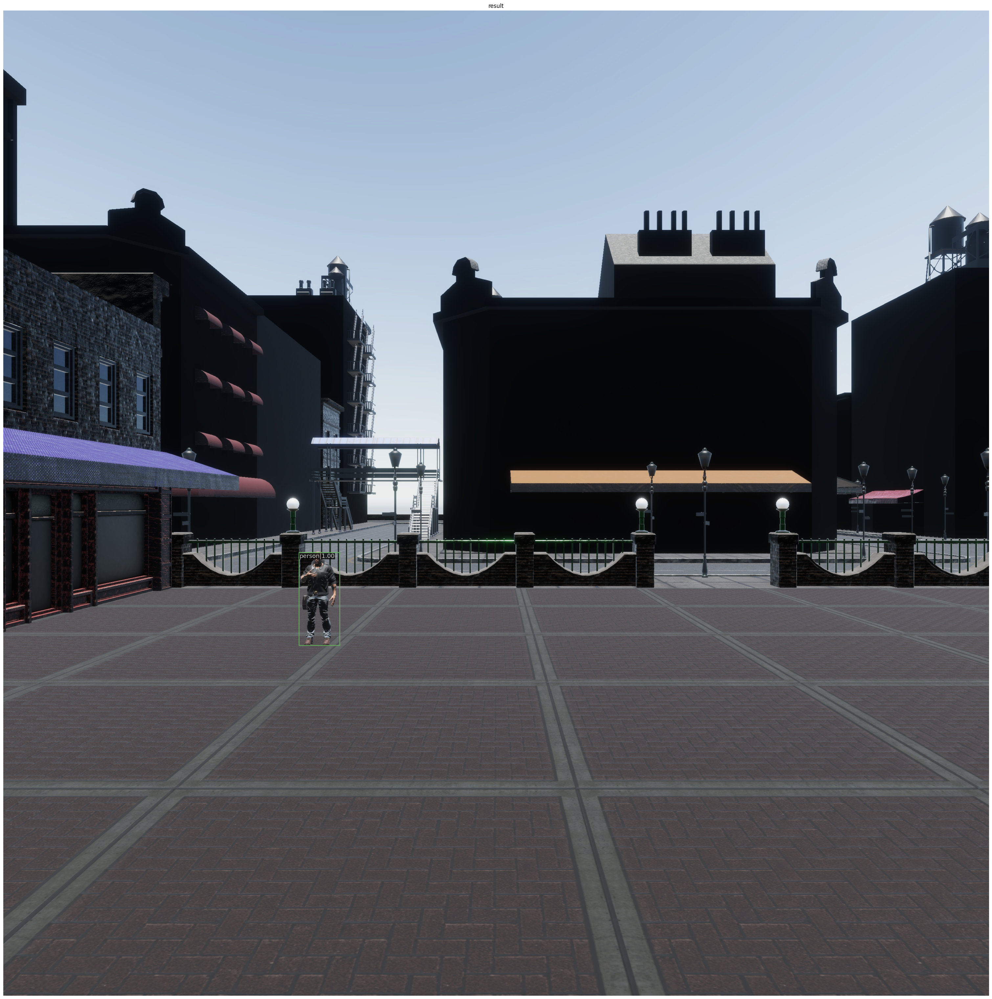

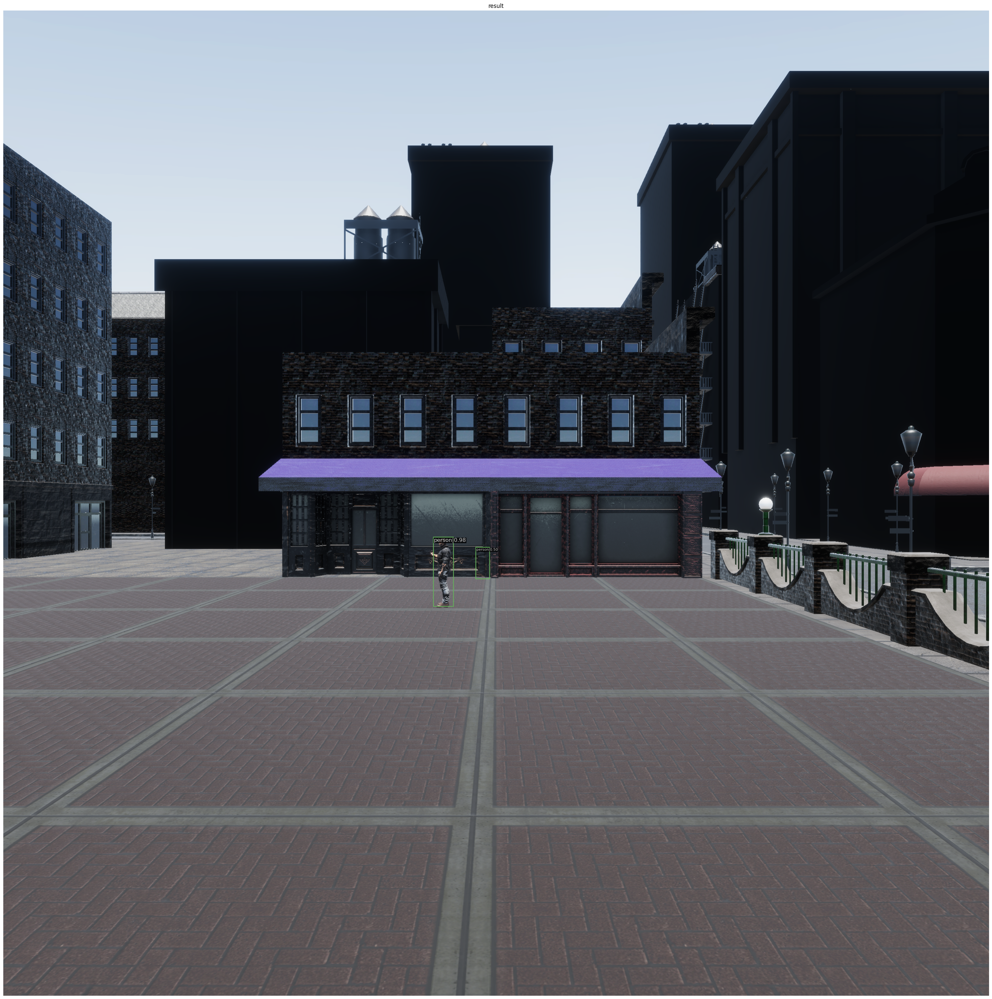

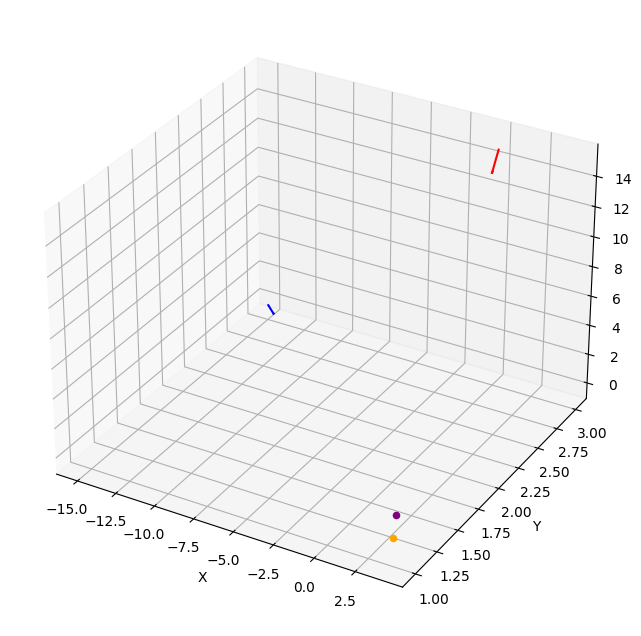

0.8263136293480381


In [5]:

def transform(coor):
    return np.array([coor[0], coor[2], coor[1]])

folder_dir = 'C:/Users/Leonard/AppData/LocalLow/DefaultCompany/Perception2/solo_18'

errs = []
for i in range(20):
    f_dir = f'{folder_dir}/sequence.{i}'
    with open(f'{f_dir}/step0.frame_data.json') as json_file:
        data = json.load(json_file)
    captures = data['captures']

    scene = Scene.from_captures(f_dir, captures, model)
    # for (_, loc_a), (_, loc_b) in zip(scene.gt_locations, scene.pred_locations):
    for (_, loc_a), (_, loc_b) in zip(scene.locations, scene.pred_locations):
        err = np.sqrt(
            ((loc_b - loc_a.origin)**2).sum()
        )
        errs.append(err)
    
    
    colors = ['red', 'blue']
    fig = plt.figure(figsize=(8, 8))
    ax = fig.add_subplot(111, projection='3d')
    # ax1.view_init(20, -120)
    ax.set_xlabel("X")
    ax.set_ylabel("Y")
    ax.set_zlabel("Z")
    for i, camera in enumerate(scene.cameras):
        stack_origin = np.stack([camera.position])
        ax.quiver(
            stack_origin[:, 0],
            stack_origin[:, 1],
            stack_origin[:, 2],
            np.array([r[1].direction for r in camera.pred_lines])[:, 0],
            np.array([r[1].direction for r in camera.pred_lines])[:, 1],
            np.array([r[1].direction for r in camera.pred_lines])[:, 2],
            color=colors[i], length=1.0, arrow_length_ratio=.1, normalize=True
        )

    # print('lpm', np.sum((point - output['3D_location'])**2))
    # print(point)
    # print(output['3D_location'])
    point = scene.locations[0][1].origin
    output = scene.pred_locations[0][1]
    ax.scatter(*point, color='purple')
    ax.scatter(*output, color='orange')
    plt.show()
    
    break

print(np.mean(errs))

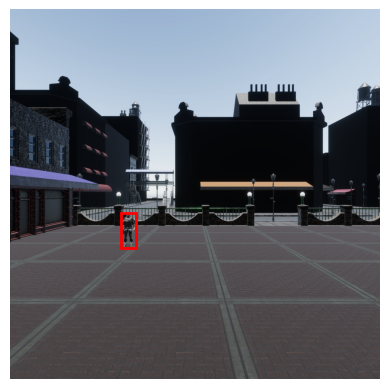

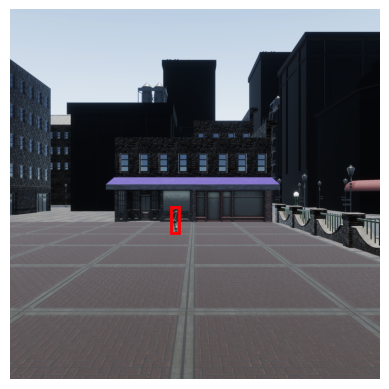

In [6]:
scene.show_pred_bboxes()

In [ ]:

def transform(coor):
    return np.array([coor[0], coor[2], coor[1]])
    # return np.array([coor[0], coor[1], coor[2]])

colors = ['red', 'blue']
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection=Axes3D.name)
# ax.view_init(0, 0, 0)
# ax.set_aspect('equal')
ax.set_xlabel("X")
ax.set_ylabel("Y")
ax.set_zlabel("Z")
# ax.set_zlim3d(bottom=0, top=5) 
ax.set_xlim([-17, 5])
ax.set_ylim([-5, 17])
ax.set_zlim([0, 5])
for i, camera in enumerate(scene.cameras):
    print(camera.position)
    # stack_origin = np.stack([camera.position])
    position = transform(camera.position)
    # position = camera.position
    line = camera.pred_lines[0][1]
    line_direction = transform(line.direction)
    
    ax.scatter(*transform(camera.position), color=colors[i])
    ax.quiver(
        position[0],
        position[1],
        position[2],
        # np.array([r[1].direction for r in camera.pred_lines])[:, 0],
        # np.array([r[1].direction for r in camera.pred_lines])[:, 1],
        # np.array([r[1].direction for r in camera.pred_lines])[:, 2],
        line_direction[0],
        line_direction[1],
        line_direction[2],
        color=colors[i], length=2.0, arrow_length_ratio=.1, normalize=True
    )

# print('lpm', np.sum((point - output['3D_location'])**2))
# print(point)
# print(output['3D_location'])
point = transform(scene.locations[0][1].origin)
output = transform(scene.pred_locations[0][1])



ax.scatter(*point, color='purple')
ax.scatter(*output, color='orange')
# plt.zlim([0, 5])
# plt.axis('equal')
plt.show()

In [ ]:
print(point)
print(output)

In [ ]:
temp = point
print(temp)
temp[[1, 2]] = temp[[2, 1]]
temp